# Fluid Statics I

## Learning outcomes

* Derive Pascal's Law
* Learn about how pressure is distributed in volumes of fluid at rest
* Learn about hydrostatic pressure
* Explore how pressure and temperature is distributed in the Earth's atmosphere
* Compare different units of pressure measurement

# Introduction

Herein we will describe hydrostatics in some detail. This, and many of the other topics we will cover, will involve some mathematics, but I will endeavour to help your understanding of this with diagrams, animations and interactive python code snippets. As with all problems in engineering and physics we attempt to gain an understanding of the world by imagining a simpler version of reality ignoring all wrinkles and disturbances and focusing on the general nature of the system. In the example below we take the ocean floor and imagine a cube of sea water and the sand beneath it. We simplify this as a perfectly still region of fluid so that the upper and lower surface are perfectly flat. We assume that the sea bed is completely rigid and does not move. We ignore and influences from the side and assume that invisible force fields are preventing the water escaping – or simply that the side walls are periodic so that any water exiting one side is transported into the opposite side. Any disturbance will eventually dissipate and we are left with a perfectly still box of fluid. Now within this volume of fluid we can consider a finite element of fluid.

It is important to be able to look at the world in this manner and reduce complex systems to these kinds of cartoons. As we learn more about the system we can add complexity.

<img src="media/2.1/fluid_statics.png" alt="Fluid Statics and fluid domains" width="800" title="Conceptualising fluid domains" />
<center>When performing calculations in engineering we often need to take a complex snapshot of the real world, for example a section of the sea bed (left) and simplify it to a more straightforward approximation, in this case a stationary incompressible fluid on a rigid flat floor (middle) and further consider a fluid element in this 2.5D model of reality. </center>


## Pascal's Law

We touched on Pascal's Law in the previous notebook. Here it is again.

<div class="alert alert-block alert-info">
\begin{equation*}
\Delta P = \rho g \Delta h
\end{equation*}
</div>

We've previously looked at Boyles's Law for gases and how this lead to the **Ideal Gas law**. Pascal's Law deals with **incompressible fluids**. This is a limiting case as we know that air can be readily compressed with enough effort by an air compressor or a fighter jet flying at supersonic speeds. Water, like most dense liquids, on the other hand can be considered incompressible. So the Pascal's Law is applicable in cases where we can consider the fluid to be incompressible and the density $\rho$ doesn't change. Surprisingly this covers a lot of engineering problems. A cylinder of compressed air at rest is subject to Pascal's law because in that state it's density is constant.

Lets begin by considering the fluid element shown above.


Note, if you are using Google Colaboratory or Jupyter's nbviewer, the interactive 3D viewer does not yet work.
You can use this video as a workaround if required. The HTML version should work fine.

<video controls src="media/2.1/PyGEL3D_proxy_pascal.mp4" width="700" />

In [38]:
import sys

if sys.platform != 'linux': 
    
    from pygel3d import hmesh, gl_display as gl
    from pygel3d import jupyter_display as jd
    m = hmesh.load("media/2.1/pascal.obj")

    jd.set_export_mode(True)
    jd.display(m, smooth=False,data=None)
        
else:
    print('play video in previous cell')

Since the fluid is at rest there are no shear stresses and we can consider only the normal stresses acting on each surface. Our fluid element has a finite volume and constant density therefore it has a finite weight $\delta W$. Each edge has a length $\delta x$, $\delta y$, $\delta z$ or $\delta s$. The volume of the element is simply

\begin{align}
\delta V = \frac{1}{2}\delta x \delta y \delta z
\end{align}

The weight, that is the force experienced due to gravity, is then:

\begin{align}
\delta W = \text{Mass} \times \text{Acceleration due to Gravity} =  \frac{1}{2} \rho g \delta x \delta y \delta z
\end{align}

Now lets consider the sum of the forces acting on the element in the $x$ and $z$ directions respectively. Since the fluid is static and therefore at rest the sum of the forces must be zero. Note the signs of each term relative to the coordinate axes above.

\begin{align}
\sum F_x = 0 = p_x \delta y \delta z - p_s \delta y \delta s \sin{\theta}
\end{align}

For the forces in the vertical $z$ direction we must not forget to include the weight of our fluid element.

\begin{align}
\sum F_z = 0 = p_z \delta y \delta x - p_s \delta y \delta s \cos{\theta} - \delta W
\end{align}

Conveniently we observe that $\delta z = \delta s \sin{\theta}$ and $\delta x = \delta s \cos{\theta}$ so we can simplify:

\begin{align}
p_x = p_s
\end{align}

<div class="alert alert-block alert-info">
\begin{align}
p_z =  p_s + \frac{1}{2} \rho g \delta z
\end{align}
</div>

The first result, $p_x = p_s$ tells us that there is no variation of pressure in the horizontal direction in a static fluid.

The second result, $p_z =  p_s + \frac{1}{2} \rho g \delta z$ tells us that pressure in the vertical direction is proportional to the fluid density, gravitational acceleration and depth.

Taking the limit of $\delta V \rightarrow 0$ so that $\delta z \rightarrow 0$ we find that $p_z = p_s$ and so:
\begin{align}
p_s = p_x = p_z
\end{align}

Pressure is a compressive surface force; the normal stress acting on any surface and there are no shear stresses in this static scenario. If we consider a case where the density of the fluid is very small and the height is reasonably shallow, such as a small helium balloon we can consider the pressure force to be equally distributed normal to the balloon's surface. We can make similar simplifications with pressure vessels such as gas tanks.

For denser fluids such as liquids we cannot make this simplification and therefore must consider the effect of depth. The image below illustrates Pascal's law in a number of differently shaped containers for the same height of fluid. The fluid colour indicates the local pressure.

<img src="media/2.1/fluid_statics2.png" alt="Hydrostatic pressure in various geometries" width="800" title="Hydrostatic pressure in various geometries" />
<center>This image shows what the pressure field in a static fluid looks like in a number of different geometries. Note that the surface of the fluid in each container is at the same height. Regardless of the geometry the pressure is simply proportional to depth as indicated by the colours.</center>

## Examples

Lets look at a few simple examples based on this result to get an intuitive understanding of the physics.

Consider a pint glass full of water, what is the **gauge pressure** at the bottom? 
We will assume the glass is a cylinder with a height of $18 cm$ and a diameter of $6 cm$. 
The volume is therefore $0.5$ litres — approximately one pint.
Water at room temperature has a density of $999~kg/m^3$

\begin{align} 
p = \rho g h = 999 \times 9.81 \times 0.18 = 1.764 kPa
\end{align}

If the base of the glass has a diameter of $6 cm$, the surface area of the base is $\pi \times 0.03^2 = 0.002827 m^2$.
The force experienced by the bottom of the glass is therefore:

\begin{align} 
\text{Force} = \text{Pressure} \times \text{Area} = 1,764 \times 0.002827 = 4.89 N
\end{align}

Which is simply due to the weight of the fluid in the glass, $4.89 / 9.81 = 0.5 kg$.

Next compute the pressure at a depth of $1 km$ under the ocean.
The density of salt water can be assumed to be $\rho = 1023 kg/m^3$

\begin{align} 
p = \rho g h = 1023 \times 9.81 \times 1000 = 10 MPa
\end{align}

This is a very large number, almost half the compressive strength of concrete. A vessel with a surface area of $10m^2$ submerged at a depth of 1 kilometre will experience a compressive load of 1 million Newtons across its hull.




## Pressure Distribution

The two examples above illustrate that as we dive deeper into the water from the depth of a glass to deep under the sea the pressure increases. We've also seen previously how the pressure (and density) varies in the Earth's atmosphere. Now we will analyse this in more detail.

Consider an infinitesimal element of incompressible fluid as rendered below. 

Again if we sum the forces in the vertical direction.

\begin{align}
F_z = -(p+dp)dA + pdA - \rho g~{dA}~{dz} = 0
\end{align}

\begin{align}
dp = -\rho g dz
\end{align}

we obtain the **Hydrostatic Equation**
\begin{align}
\frac{dp}{dz} = -\rho g
\end{align}

Integrating between two points:

\begin{align}
\int_1^2 dp = -\int_1^2 \rho g dz
\end{align}

<div class="alert alert-block alert-info">
\begin{align}
p_2 - p_1 = -\rho g \left(z_2 - z_1 \right)
\end{align}
</div>

Therefore the pressure difference between two vertical points can determined based on their vertical separation.

Note again, if you are using Google Colaboratory or nbviewer the interactive 3D viewer does not work.
You can use this video if required. The HTML version should work fine.

<video controls src="media/2.1/PyGEL3D_proxy_pressure_dist.mp4" width="700" />

In [45]:
m = hmesh.load("media/2.1/pressure_dist.obj")

pos = m.positions()
pos+=2
jd.set_export_mode(True)

#jd.display(m, smooth=False,data=None)
jd.display(m, smooth=False,data=pos[:,2])

## Pressure Variation in the Atmosphere

We have already discussed the compressibility of gases such as air in terms of ideal gas law: $p = \rho R T$. We now have an expression for differential pressure $dp = -\rho g dz$. 

Rearranging the ideal gas law:

\begin{align}
\rho = \frac{p}{R T}
\end{align}

Putting these together we have:

\begin{align}
dp = -\frac{p}{R T} g dz
\end{align}

and integrating:

\begin{align}
\int_1^2 \frac{dp}{p} = -\frac{g}{R} \int_1^2 \frac{dz}{T}
\end{align}

We can make a simplifying assumption that the atmosphere is isothermal — the temperature is homogeneous — and so we can take $T$ outside the integral as rename it $T_0$.

\begin{align}
\int_1^2 \frac{dp}{p} = -\frac{g}{R T_0} \int_1^2 dz
\end{align}

The left side integral can be tackled as follows:
\begin{align}
\int_1^2 \frac{1}{p}dp = \log(p)\big\rvert_1^2 ~= \log(p_2) - \log(p_1) = \log\frac{p_2}{p_1}
\end{align}

while the right hand side is straight forward, so we obtain:

\begin{align}
\log\frac{p_2}{p_1} = -\frac{g}{R T_0} (z_2 - z_1)
\end{align}

which can be rewritten:

\begin{align}
p_2 = p_1 \exp \left( -\frac{g (z_2 - z_1)}{R T_0} \right)
\end{align}

Lets plot this!

Atmospheric pressure distribution assuming constant temperature


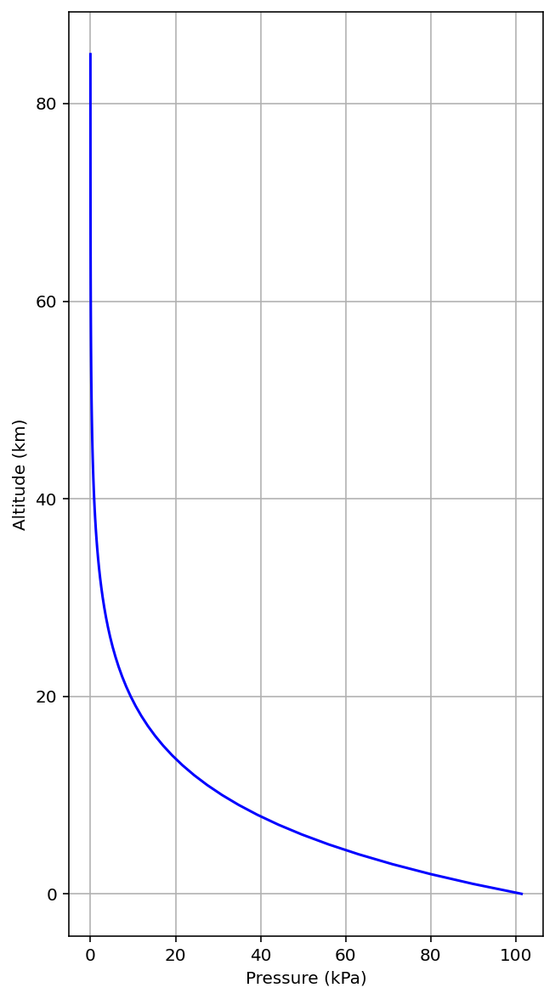

In [12]:
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Create an array with a range of z values from 0 to 86 km with a step size of 1 km
z = np.arange(0,86e3,1000) # m

p_1 = 101.32e3  # Pa
T_0 = 288.16    # K
g = 9.81        # m/s/s
R = 287.05      # J/Kg.K

# Here is our equation written in code, note that since z is an array, the output p_2 will also be an array
p_2 = p_1 * np.exp(-g * z / R / T_0)

plt.subplots(figsize=(5,10))
plt.plot(p_2/1000,z/1000,'b-')
plt.grid(True)
plt.xlabel('Pressure (kPa)')
plt.ylabel('Altitude (km)')

print("Atmospheric pressure distribution assuming constant temperature")

However we have already seen that the temperature of the atmosphere is not isothermal and varies significantly with altitude. Within the troposphere ($<11,000 m$) we observe that the temperature gradient is reasonably linear. Therefore we can make a more physically-accurate simplification:

\begin{align}
T(z) \approx T_0 - B z
\end{align}

where $T_0$ is the temperature at sea level and B is known as the lapse rate of temperature.

According to the International Standard Atmosphere $T_0 = 288.16 K$ and $B = 0.0065 K/m$ for $0 \leq z \leq 11,000 m$
(The model lists a lapse rate for each atmospheric layer)

We can now take a step back and return temperature back inside the integral, substitute with our new linear model and integrate between the ground (zero) and some arbitrary $z$:

\begin{align}
\int_0^z \frac{dp}{p} = -\frac{g}{R} \int_0^z \left( \frac{1}{T_0 - Bz} \right) dz
\end{align}

The integral on the right hand side is a special case of Cavalieri's quadrature formula with a unit negative exponent.

<div class="alert alert-block alert-info">
\begin{align}
\int (ax + b)^{-1} dx = \frac{1}{a} \log |ax + b|  + \text{Constant}
\end{align}
</div>

and can be tackled as follows:

\begin{align}
-\frac{g}{R} \int_0^z \left( \frac{1}{T_0 - Bz} \right) dz = 
 \frac{g}{RB} \log(T_0 - Bz) \big\rvert_0^z ~=  \frac{g}{RB} \log \left( \frac{T_0 - Bz}{T_0} \right)
\end{align}

(note that $-\frac{1}{B}$ eliminates the negative sign in the group outside the integral)

putting it all together:

\begin{align}
\log\frac{p_z}{p_0} = \frac{g}{RB} \log \left( \frac{T_0 - Bz}{T_0} \right)
\end{align}

and one obtains:

\begin{align}
p(z) = p_0 \left( 1 - \frac{Bz}{T_0} \right)^ \left( \frac{g}{RB} \right)
\end{align}

Lets plot these equations and compare it to the International Standard Atmosphere model we looked at earlier. Note that the above equations are used to generate the International Standard Atmosphere in the troposphere and so this is more a sanity check than a verification of theory. If you are interested, see if you can find actual meteorological data for comparison.

International Standard Atmosphere model


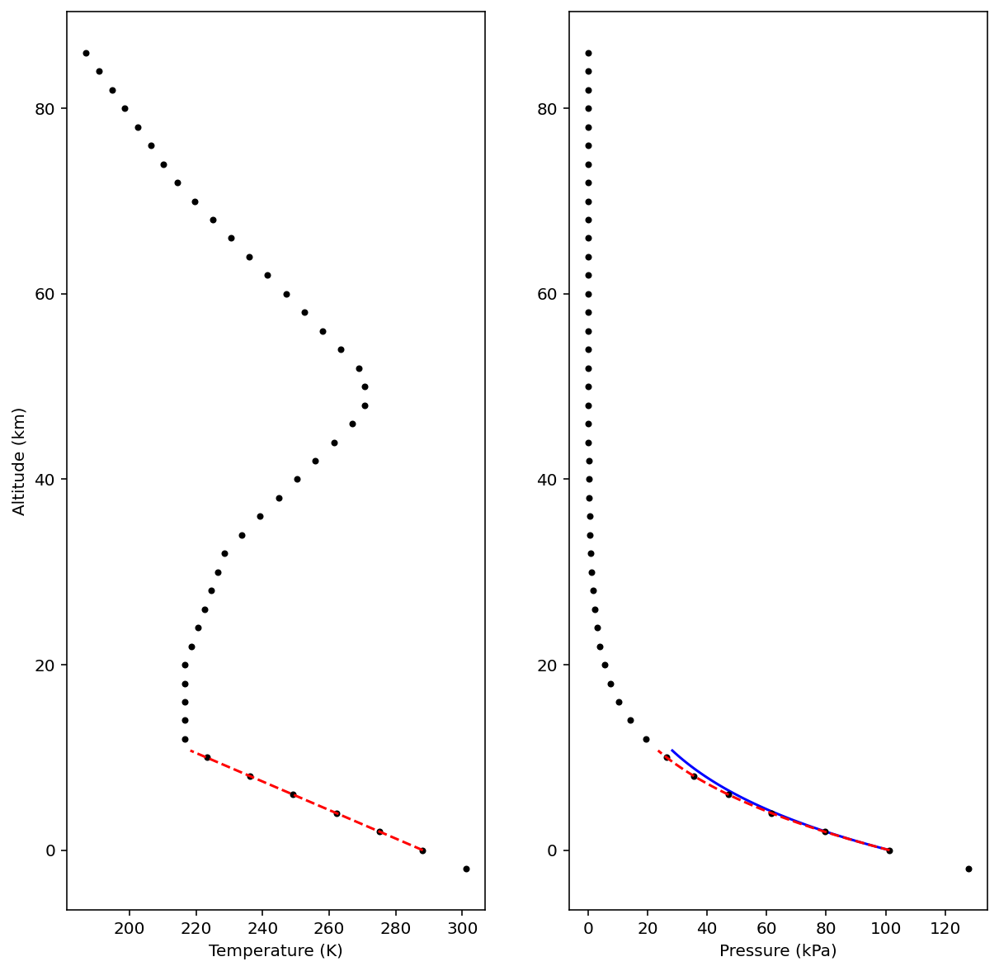

In [13]:
# International Standard Atmosphere model
Altitude = [-2.0,  0.0,  2.0,  4.0,  6.0,  8.0, 10.0, 12.0, 14.0, 16.0, 18.0, 20.0, 22.0, 24.0, 26.0, 28.0, 30.0, 32.0, 34.0, 36.0, 38.0, 40.0, 42.0, 44.0, 46.0, 48.0, 50.0, 52.0, 54.0, 56.0, 58.0, 60.0, 62.0, 64.0, 66.0, 68.0, 70.0, 72.0, 74.0, 76.0, 78.0, 80.0, 82.0, 84.0, 86.0]
Temperature = [301.2, 288.1, 275.2, 262.2, 249.2, 236.2, 223.3, 216.6, 216.6, 216.6, 216.6, 216.6, 218.6, 220.6, 222.5, 224.5, 226.5, 228.5, 233.7, 239.3, 244.8, 250.4, 255.9, 261.4, 266.9, 270.6, 270.6, 269.0, 263.5, 258.0, 252.5, 247.0, 241.5, 236.0, 230.5, 225.1, 219.6, 214.3, 210.3, 206.4, 202.5, 198.6, 194.7, 190.8, 186.9]
Pressure = [1.278e+02, 1.013e+02, 7.950e+01, 6.166e+01, 4.722e+01, 3.565e+01, 2.650e+01, 1.940e+01, 1.417e+01, 1.035e+01, 7.565e+00, 5.529e+00, 4.047e+00, 2.972e+00, 2.188e+00, 1.616e+00, 1.197e+00, 8.890e-01, 6.634e-01, 4.985e-01, 3.771e-01, 2.871e-01, 2.200e-01, 1.695e-01, 1.313e-01, 1.023e-01, 7.977e-02, 6.221e-02, 4.833e-02, 3.736e-02, 2.872e-02, 2.196e-02, 1.669e-02, 1.260e-02, 9.459e-03, 7.051e-03, 5.220e-03, 3.835e-03, 2.800e-03, 2.033e-03, 1.467e-03, 1.052e-03, 7.498e-04, 5.308e-04, 3.732e-04]

T_0 = 288.16    # K
B = 0.0065      # K/m
p_0 = 101.32e3  # Pa
g = 9.81        # m/s/s
R = 287.05      # J/Kg.K 

# Create an array with a range of z values from 0 to 11,000m with a step size of 250m
z = np.arange(0,11e3,250)

# Here is our old equation assuming isothermal behaviour
p_2 = p_1 * np.exp(-g * z / R / T_0)

# This is our equation we use to describe the temperature lapse rate < 11km
T_z = T_0 - B*z

# Here is our new equation taking the temperature lapse rate into account
p_z = p_0 * ( 1 - B*z/T_0)**(g/R/B)

plt.subplots(1,2,figsize=(10,10))

plt.subplot(121)
plt.plot(Temperature,Altitude,'k.')
plt.plot(T_z,z/1000,'r--')
plt.ylabel('Altitude (km)')
plt.xlabel('Temperature (K)')

plt.subplot(122)
plt.plot(p_2/1000,z/1000,'b-')
plt.plot(Pressure,Altitude,'k.')
plt.plot(p_z/1000,z/1000,'r--')
plt.xlabel('Pressure (kPa)')

print('International Standard Atmosphere model')

## The Mercury Barometer

A venerable and reliable method for measuring atmospheric pressure is the Mercury Barometer (Torricelli, 1644). We have already encountered a similar apparatus as used by Boyle in his experiments.

Mercury has a density of $13,594 kg/m^3$ which is much greater than that of water ($1,000 kg/m^3$). This means than a mercury barometer is much more compact than an equivalent device which uses water. We often describe the relative difference in density as a *Specific Gravity* where:

\begin{align}
SG = \frac{\rho}{\rho_{H_2O}}
\end{align}

A mercury barometer is assembled by pouring a small quantity of the liquid metal into a narrow glass tube which is closed at one end. The tube is inverted so that the open end is at the bottom and then placed into a reservoir of mercury. The mercury level in the tube will reach an equilibrium as the weight of the column of mercury and the vapour pressure at the closed end of the tube is balanced by the atmospheric pressure so that: 

\begin{align}
p_{atm} = \rho g h + p_\text{vapour}
\end{align}

Atmospheric pressure acts on the exposed free surface of the mercury in the reservoir and changes in the atmospheric pressure results in noticeable changes in the height of the mercury column.

Mercury has a vapour pressure of just $0.2666 Pa$. This indicates that liquid mercury is not particularly volatile and the vapour pressure can be neglected when calculating the atmospheric pressure. Ethanol on the other hand has a vapour pressure of $5.8~kPa$ at room temperature.

<img src="media/2.1/mercury_barometer.png" alt="Mercury Barometer" width="350" title="Mercury Barometer`" />
<center>
</center>

There is a Mercury barometer mounted on the wall in Laboratory 005.

How tall would a water barometer have to be?

In [14]:
# Atmospheric pressure
p_a = 101.32e3  # Pa

# Water
p_v_w = 2329.8  # Pa, vapour pressure
rho_w = 1000    # kg/m^3

# Mercury
p_v_m = 0.2666  # Pa, vapour pressure
rho_m = 13594   # kg/m^3

g = 9.81        # m/s/s

# Calculate required column height at standard atmospheric pressure
h_w = (p_a - p_v_w)/rho_w/g

h_m = (p_a - p_v_m)/rho_m/g

print("Water column is", "{:.2f}".format(h_w),"m")
print("Mercury column is", "{:.2f}".format(h_m),"m")

Water column is 10.09 m
Mercury column is 0.76 m


## Pressure Units

The SI unit of pressure is the Pascal ($Pa$) which corresponds to 1 Newton of force per metre squared. There are many other units. A common one is height in Mercury

- Pascal: $1~Pa = 1~N/m^2$
- Atmosphere: $1~atm = 101.32~kPa$
- Inches of Mercury: $29.92~in Hg = 0.76~mHg= 1 atm$
- Millimetres of Mercury: $1~mmHg = 133.3224 Pa$
- Bar: $1~bar = 100~kPa = 0.99~atm $
- Pounds per square inch: $1~psi = 6.89~kPa$
- Torr: $1~\text{Torr} = \frac{1}{760}atm = 0.999999857533699...~mmHg$

Additionally pressure is often measured in terms of pressure head $(m)$ which corresponds to the height of a column of liquid supported by the pressure under consideration. This is often convenient when quantifying the loss in a system. We will see more of this later.


# Finishing Up

We're only warming up with hydrostatics! Next we will explore Manometers where we will utilise what we've learned thus far to measure pressure.